# Monthly vegetation condition anomalies

* **Products used:**
[ndvi_climatology_ls](https://explorer.digitalearth.africa/ndvi_climatology_ls), [wofs_ls_summary_alltime](https://explorer.digitalearth.africa/wofs_ls_summary_alltime),
[s2_ls2](https://explorer.digitalearth.africa/), [ls8_sr](https://explorer.digitalearth.africa/ls8_sr), [ls9_sr](https://explorer.digitalearth.africa/ls9_sr)

## Background
Understanding how the vegetated landscape responds to longer-term environmental drivers such as the El Nino Southern Oscillation (ENSO) or climate change, requires the calculation of standardised anomalies. Standardised anomalies subtract the long-term mean from an observation of interest and then divide the result by the long-term standard deviation, thus removing seasonal variability and highlighting change related to longer-term drivers.


### Description

This notebook will calculate monthly _standardised_ NDVI anomalies for any given month and year, and relies on DE Africa's 30 metre resolution [NDVI climatology](https://docs.digitalearthafrica.org/en/latest/data_specs/NDVI_Climatology_specs.html) product to define the baseline vegetation condition. Sentinel-2, and Landsat 8/9 are used to calculate the monthly mean NDVI for the month of interest. The standardised anomaly is then calculated as:
        
\begin{equation}
\text{Standardised anomaly }=\frac{x-m}{s}
\end{equation}

where $x$ is NDVI for the month of interest, $m$ is the long-term mean, and $s$ is the long-term standard deviation.

The following steps are taken in the notebook:
1. Load a polygon for the Kenyan county of interest (a geojson with the Kenyan counties boundaries is already provided)
2. Load DE Africa's NDVI climatology product
3. Use WOfS to remove waterbodies from the region
4. Load cloud masked Sentinel-2 and Landsat satellite data
5. Preprocess the satellite data so we have one continuous, noise free time-series of NDVI.
6. Create mask of the county boundary 
7. Calculate standardised NDVI anomalies
8. Plot the NDVI anomalies

## Getting started
**To run this analysis**, run all the cells in the notebook, starting with the "Load packages" cell.


### Load packages
Load key Python packages and supporting functions for the analysis.

In [1]:
%matplotlib inline

import os

import datacube
import geopandas as gpd
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
from datacube.utils import masking
from datacube.utils.geometry import CRS, Geometry
from deafrica_tools.bandindices import calculate_indices
from deafrica_tools.dask import create_local_dask_cluster
from deafrica_tools.datahandling import load_ard
from deafrica_tools.plotting import display_map
from deafrica_tools.spatial import xr_rasterize

## Set up a Dask cluster

Dask can be used to better manage memory use and conduct the analysis in parallel. 
For an introduction to using Dask with Digital Earth Africa, see the [Dask notebook](../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

>**Note**: We recommend opening the Dask processing window to view the different computations that are being executed; to do this, see the *Dask dashboard in DE Africa* section of the [Dask notebook](../Beginners_guide/08_parallel_processing_with_dask.ipynb).

To use Dask, set up the local computing cluster using the cell below.

In [2]:
create_local_dask_cluster()

Client Scheduler: tcp://127.0.0.1:35299 Dashboard: /user/victoria@kartoza.com/proxy/8787/status,Cluster Workers: 1 Cores: 15 Memory: 104.37 GB


### Connect to the datacube
Activate the datacube database, which provides functionality for loading and displaying stored Earth observation data.

In [3]:
dc = datacube.Datacube(app="Vegetation_anomalies")

### Analysis parameters

The following cell sets important parameters for the analysis:

* `vector_file`: file path for the shapefile containing polygons for the boundaries of Kenyan counties
* `attribute_col`: The column in the "vector_file" containing the county names.
* `county`: In this analysis, we'll select a Kenyan County to mask the dataset and analysis.
* `time_x`: This is the period for which we want to calculate anomalies.
* `resolution`: The x and y cell resolution of the satellite data. If loading a large area, then increase the resolution so the data will fit into memory.
* `output_crs` : The coordinate reference system that the loaded data is to be reprojected to.
* `dask_chunks`:  the size of the dask chunks, dask breaks data into manageable chunks that can be easily stored in memory, e.g. `dict(x=1000,y=1000)`
* `output_dir` :  The directory in which to store results from the analysis.
* `min_num_obs` : The minimum number of clear observations for creating a quality assurance mask for the NDVI climatology. The minimum number of clear observations should be ~20-30 observations.
* `water_threshold` : Value by which to threshold WOfS annual frequency to classify water/not-water.

Anomaly is calculated as:

\begin{equation}
\text{anomaly}={x}-{m}
\end{equation}

where **x** is the monthly mean, **m** is the long-term mean.


Standardised anomaly is calculated as:

\begin{equation}
\text{Standardised anomaly }=\frac{x-m}{s}
\end{equation}

$x$ is the monthly mean, $m$ is the long-term mean, and $s$ is the long-term standard deviation.

**If running the notebook for the first time**, keep the default settings below.
This will demonstrate how the analysis works and provide meaningful results.


In [4]:
vector_file = "data/Kenya_Counties.geojson"
attribute_col = "COUNTY_NAME"

# Select a county, for the example we will use Turkana County, a complete list of counties is available below.
county = "Turkana"

# Set the range of dates for the climatology, this will be the reference period (m) for the anomaly calculation.
# Standard practice is to use a 30 year period, so we've used 1984 to 2014 in this example.
time_m = ("1984", "2014")

# Time period to calculate the anomalies and standardised anomalies for (x).
time_x = ("2021", "2022")

# WOFLS and NDVI native resolution is (-30,30).
resolution = (-120, 120)
output_crs = "EPSG:6933"

# Size of dask chunks.
dask_chunks = dict(x=1000, y=1000)

# Create the output directory to store the results.
output_dir = "results"
os.makedirs(output_dir, exist_ok=True)

min_num_obs = 20

water_threshold = 0.50

### Load the Kenyan counties shapefile

This shapefile contains polygons for the boundaries of Kenyan counties and will allows us to calculate NDVI anomalies within a chosen county.

In [5]:
kenyan_counties = gpd.read_file(vector_file)
kenyan_counties.explore()

### List counties

You can change the county in the analysis parameters cell to any Kenyan county. A complete list of counties is printed below.

In [6]:
print(np.unique(kenyan_counties[attribute_col]))

['Baringo' 'Bomet' 'Bungoma' 'Busia' 'Elgeyo-Marakwet' 'Embu' 'Garissa'
 'Homa Bay' 'Isiolo' 'Kajiado' 'Kakamega' 'Kericho' 'Kiambu' 'Kilifi'
 'Kirinyaga' 'Kisii' 'Kisumu' 'Kitui' 'Kwale' 'Laikipia' 'Lamu' 'Machakos'
 'Makueni' 'Mandera' 'Marsabit' 'Meru' 'Migori' 'Mombasa' "Murang'a"
 'Nairobi' 'Nakuru' 'Nandi' 'Narok' 'Nyamira' 'Nyandarua' 'Nyeri'
 'Samburu' 'Siaya' 'Taita Taveta' 'Tana River' 'Tharaka-Nithi'
 'Trans Nzoia' 'Turkana' 'Uasin Gishu' 'Vihiga' 'Wajir' 'West Pokot']


### Setup polygon

The county selected needs to be transformed into a geometry object to be used in the `load_ard` function.

In [7]:
idx = kenyan_counties[kenyan_counties[attribute_col] == county].index[0]
geom = Geometry(geom=kenyan_counties.iloc[idx].geometry, crs=kenyan_counties.crs)

## Load the cloud-masked satellite data

The first step in this analysis is to load in Landsat 8/9 and Sentinel-2 data for the county we've picked, and for the period we want to calculate the NDVI anomalies and standardised anomalies for (`tim_x`). The code below uses the load_ard function to load in data from Landsat 8/9 and Sentinel-2 satellites for the area and time specified. For more information, see the [Using load_ard notebook](../../Frequently_used_code/Using_load_ard.ipynb) notebook.

The dictionary, `query`, maps the analysis parameters we provided above to the `datacube.load()` parameters.

In [8]:
# Create the 'query' dictionary object for loading data form the datacube.
query = {
    "geopolygon": geom,
    "time": time_x,
    "output_crs": output_crs,
    "resolution": resolution,
    "dask_chunks": dask_chunks,
}

In [9]:
# Load available Landsat 8 and 9 data.
ds_ls = load_ard(
    dc=dc,
    products=["ls8_sr", "ls9_sr"],
    group_by="solar_day",
    measurements=["red", "nir"],
    resampling={"pixel_quality": "nearest", "*": "average"},
    mask_filters=[("opening", 3), ("dilation", 3)],  # improve cloud-mask
    verbose=False,
    **query
)

/home/jovyan/Tools/deafrica_tools/datahandling.py:474: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  pq_mask = xr.ufuncs.logical_or(pq_mask, pq_mask)
/env/lib/python3.8/site-packages/xarray/core/dataarray.py:3088: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  f(self.variable, other_variable)
/env/lib/python3.8/site-packages/xarray/core/variable.py:2420: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  f(self_data, other_data) if not reflexive else f(other_data, self_data)


In [10]:
# Load available sentinel-2 data.
ds_s2 = load_ard(
    dc=dc,
    products=["s2_l2a"],
    measurements=["red", "nir_2"],  # use nir narrow to match with LS8 nir
    group_by="solar_day",
    resampling={"pixel_quality": "nearest", "*": "average"},
    mask_filters=[("opening", 3), ("dilation", 3)],  # improve cloud-mask
    verbose=False,
    **query
)

## Calculate the mean NDVI for each month in the anomaly time period

In [11]:
# Rename to trick 'calculate_indices'.
ds_s2 = ds_s2.rename({"nir_2": "nir"})

# Calculate NDVI.
ndvi_s2 = calculate_indices(ds_s2, "NDVI", collection="s2", drop=True)
ndvi_ls = calculate_indices(ds_ls, "NDVI", collection="c2", drop=True)

# Concatenate together.
ds_ndvi = xr.concat([ndvi_ls, ndvi_s2], dim="time").sortby("time")

# Remove NDVI's that aren't between 0 and 1.
ds_ndvi = ds_ndvi.where((ds_ndvi >= 0) & (ds_ndvi <= 1))

# Smooth out noise from missed cloud.
# ds_ndvi = ds_ndvi.rolling(time=3, min_periods=1).mean()

# Get the mean NDVI for each month in the anomaly time period (x).
ds_ndvi = ds_ndvi.resample(time="1M").mean()

Dropping bands ['red', 'nir']
Dropping bands ['red', 'nir']


## Create a rasterized mask of the country boundary

Below, the county polygon is rasterized so the NDVI datasets are masked within that raster.

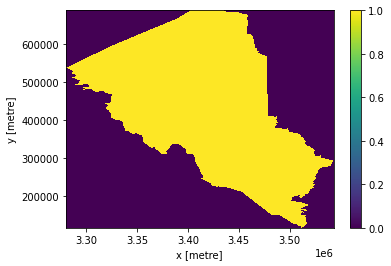

In [12]:
kenyan_counties = kenyan_counties.to_crs(output_crs)

county_mask = xr_rasterize(
    kenyan_counties[kenyan_counties[attribute_col] == county], ds_ls
)

# Plot the mask.
county_mask.plot();

## Load the WOfS All-Time Summary 

The WOfS All-Time Summary dataset will be used to create a land mask that will constrain the NDVI datasets to just the land mass.

In [13]:
# Load the WOfS all time summary dataset.
ds_wofs = dc.load(
    product="wofs_ls_summary_alltime",
    measurements=["frequency"],
    geopolygon=geom,
    output_crs=output_crs,
    resolution=resolution,
    dask_chunks=dask_chunks,
).squeeze()

In [14]:
# Convert the Dataset to a DataArray.
ds_wofs = ds_wofs.frequency

In [15]:
# Set masked terrain regions (np.nan) to 0.
ds_wofs = xr.where(np.isnan(ds_wofs), 0, ds_wofs)

If the frequency that a pixel was classified as wet in the WOfS all-time summary dataset is less than the `water_threshold` value, then the pixel is considered (classified) as land. 

In [16]:
# Threshold to create the land mask.
land_mask = ds_wofs < water_threshold

In [17]:
# Mask the 'land_mask' using the county boundary.
land_mask = land_mask.where(county_mask)

## Load DE Africa's NDVI climatologies


Due to the inconsistent data availability of Landsat 5 over equatorial Africa, and due to persistent cloud coverage over these same regions, the quality of the long-term NDVI baseline is poor in in some parts of Africa. We recommend not using/relying on the NDVI climatology product in locations where the clear obervation count is less than ~20-30 observations. Below this, the standard deviation layers are prone to data artefacts owing to temporal smoothing operations performing poorly on sparse datasets, and residual cloudy pixels not being sufficiently ‘averaged out’ by a decent volume of input data.


In [18]:
# Load the NDVI climatology product.
ds_ndvi_clim = dc.load(
    product="ndvi_climatology_ls",
    geopolygon=geom,
    output_crs=output_crs,
    resolution=resolution,
    dask_chunks=dask_chunks,
).squeeze()

In [19]:
# Function to get the NDVI climatology data for a specific month.
def get_ndvi_climatology(month_no, ds_ndvi_clim, min_num_obs, county_mask, land_mask):
    # Map months numbers to string.
    month_no_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
    month_str_list = [
        "jan",
        "feb",
        "mar",
        "apr",
        "may",
        "jun",
        "jul",
        "aug",
        "sep",
        "oct",
        "nov",
        "dec",
    ]
    months = dict(zip(month_no_list, month_str_list))
    # Get the month.
    month = months[month_no]
    # Select the NDVI climatology data for the month.
    ndvi_clim = ds_ndvi_clim[[f"mean_{month}", f"stddev_{month}", f"count_{month}"]]
    # Make a quality assurance mask.
    qa_mask = ds_ndvi_clim[f"count_{month}"] >= min_num_obs
    # Remove pixels where the number of clear observations are less than 'min_num_obs'.
    ndvi_clim = ndvi_clim.where(qa_mask)
    # Mask the dataset using the county boundary.
    ndvi_clim = ndvi_clim.where(county_mask)
    # Mask the dataset using the WOfS land mask.
    ndvi_clim = ndvi_clim.where(land_mask)
    # Add a dimension to the dataset showing the month number.
    ndvi_clim = ndvi_clim.expand_dims(dim={"month": [month_no]})
    # Rename the variables.
    ndvi_clim = ndvi_clim.rename_vars(
        {
            f"mean_{month}": "mean",
            f"stddev_{month}": "stddev",
            f"count_{month}": "count",
        }
    )
    return ndvi_clim

In [20]:
# Get the NDVI climatology data for each month in a year as a separate dataset.
month_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ndvi_climatology_datasets = [
    get_ndvi_climatology(month_no, ds_ndvi_clim, min_num_obs, county_mask, land_mask)
    for month_no in month_list
]
# Merge the datasets into a single dataset based on the dimension "month".
ndvi_climatology = xr.concat(objs=ndvi_climatology_datasets, dim="month")

In [21]:
%%time
ndvi_climatology_mean = ndvi_climatology["mean"].to_dataset(name="NDVI").compute()
ndvi_climatology_std = ndvi_climatology["stddev"].to_dataset(name="NDVI").compute()

CPU times: user 3.03 s, sys: 1.42 s, total: 4.45 s
Wall time: 17.8 s


## Calculate the per-pixel NDVI anomalies and standardised anomalies

In [22]:
# Mask the NDVI monthly means dataset using the county boundary mask.
ds_ndvi = ds_ndvi.where(county_mask)
# Mask the NDVI monthly means dataset using the WOfS land mask.
ds_ndvi = ds_ndvi.where(land_mask)

In [23]:
%%time
# Compute.
ds_ndvi = ds_ndvi.compute()

CPU times: user 2min 45s, sys: 5.3 s, total: 2min 50s
Wall time: 9min 58s


In [24]:
def temporal_mean(x):
    return x.mean("time")


def get_per_pixel_anomaly(ds):
    seasonal_mean = ds.groupby("time.month").map(temporal_mean)
    anomaly = seasonal_mean - ndvi_climatology_mean
    return anomaly


def get_per_pixel_standardised_anomaly(ds):
    seasonal_mean = ds.groupby("time.month").map(temporal_mean)
    standardised_anomaly = (
        seasonal_mean - ndvi_climatology_mean
    ) / ndvi_climatology_std
    return standardised_anomaly


# Anomalies for the county.
per_pixel_anomalies = ds_ndvi.groupby("time.year").map(get_per_pixel_anomaly)

# Standardised anomalies for the county.
per_pixel_standardised_anomalies = ds_ndvi.groupby("time.year").map(
    get_per_pixel_standardised_anomaly
)

## Plot the monthly per-pixel rainfall anomalies and standardised anomalies

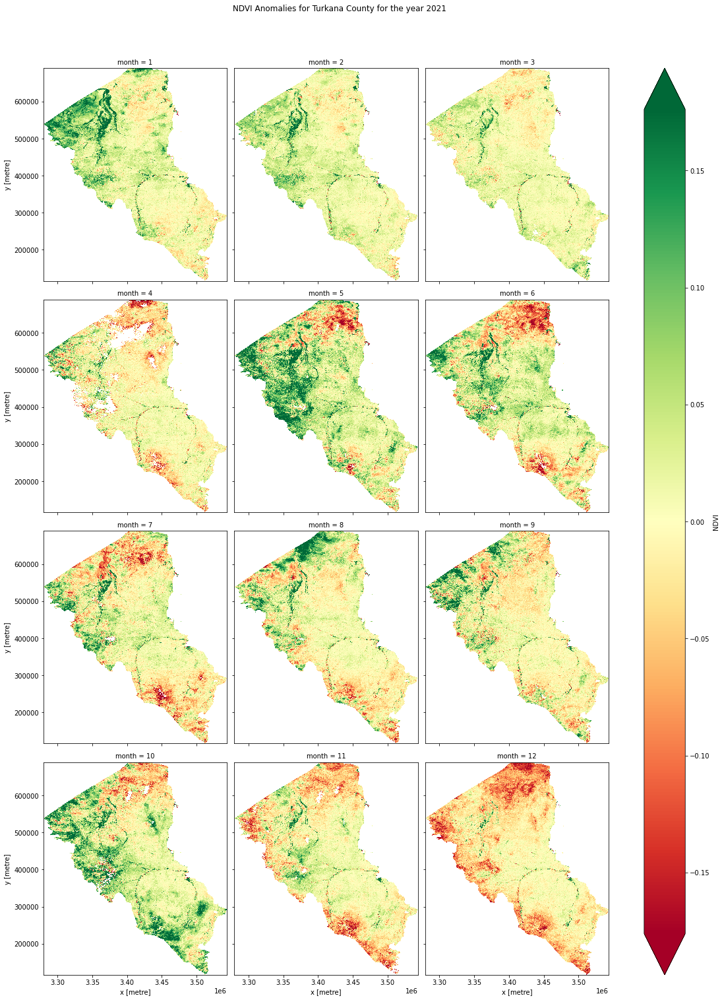

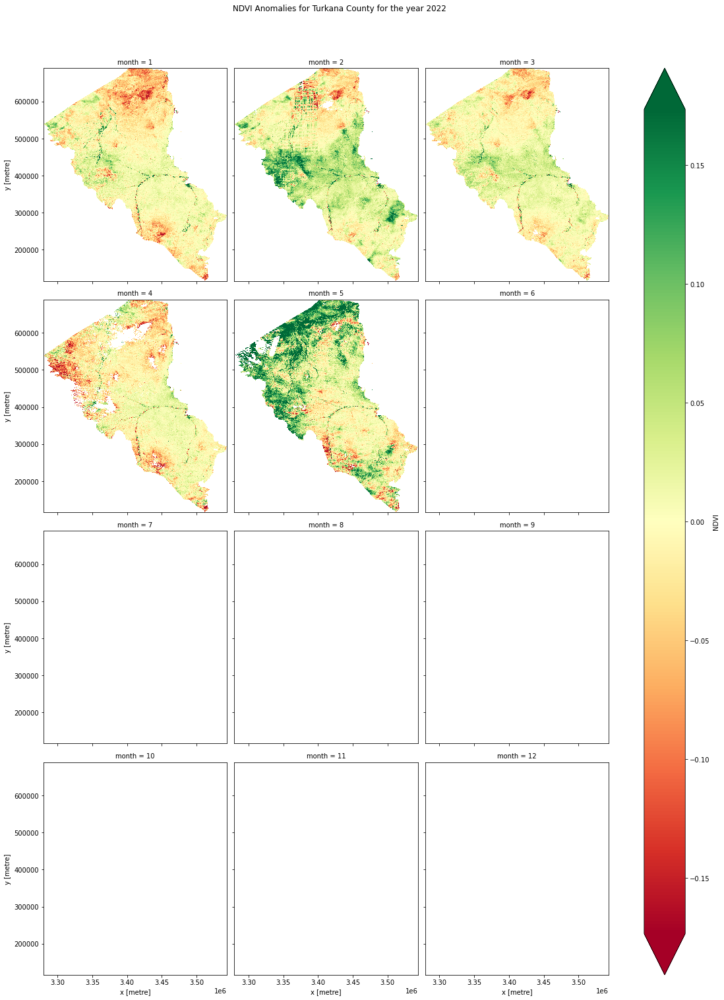

In [25]:
for year in per_pixel_anomalies.year.values:
    ds = per_pixel_anomalies.sel(year=year)
    # Plot.
    fig = ds["NDVI"].plot(col="month", col_wrap=3, cmap="RdYlGn", robust=True, size=5)
    fig.fig.suptitle(
        f"NDVI Anomalies for {county} County for the year {year}",
        x=0.45,
        y=1.05,
    )

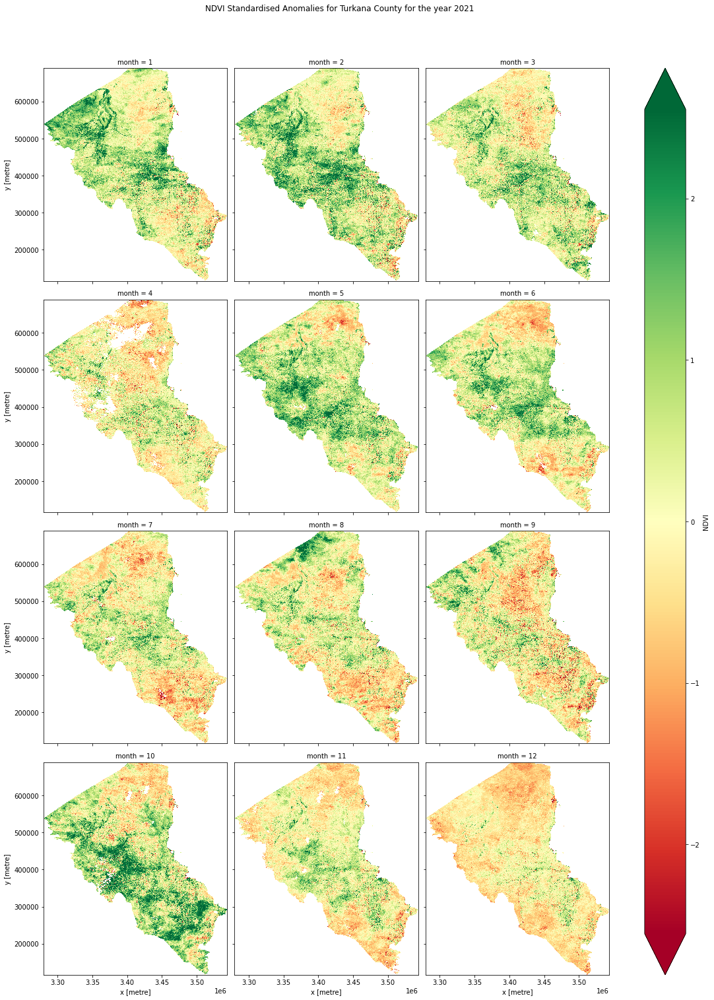

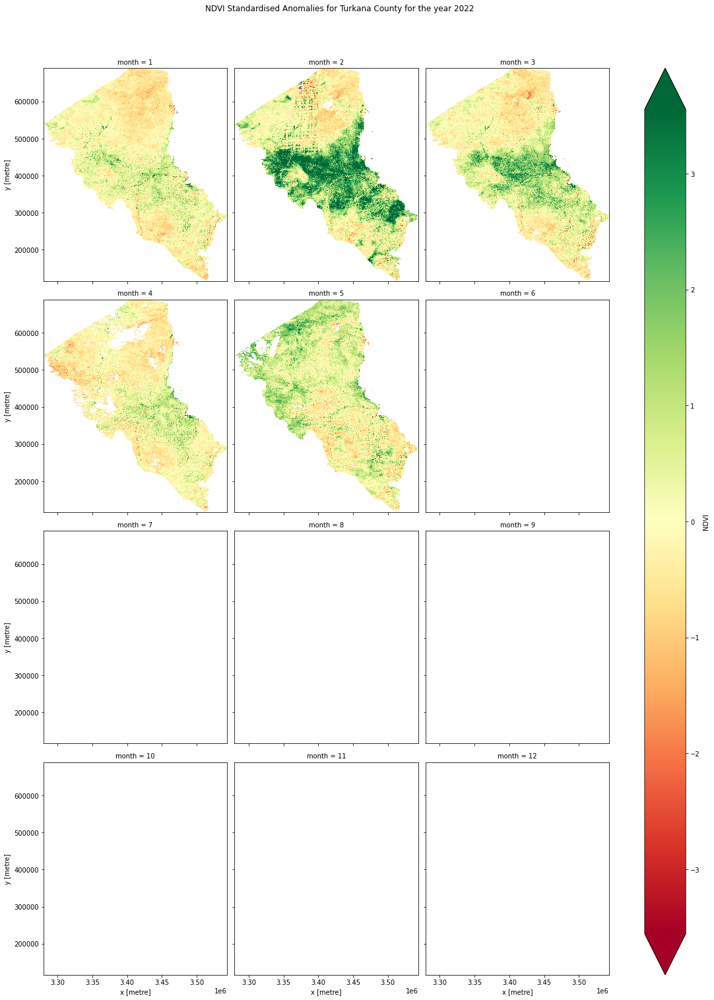

In [26]:
for year in per_pixel_standardised_anomalies.year.values:
    ds = per_pixel_standardised_anomalies.sel(year=year)
    # Plot.
    fig = ds["NDVI"].plot(col="month", col_wrap=3, cmap="RdYlGn", robust=True, size=5)
    fig.fig.suptitle(
        f"NDVI Standardised Anomalies for {county} County for the year {year}",
        x=0.45,
        y=1.05,
    )

## Calculate the aggregated monthly NDVI anomalies and standardised anomalies 

In [27]:
# Get the mean and std ndvi climatology.
ndvi_climatology_mean = (
    ndvi_climatology["mean"].mean(["x", "y"]).to_dataset(name="NDVI").compute()
)
ndvi_climatology_std = (
    ndvi_climatology["stddev"].mean(["x", "y"]).to_dataset(name="NDVI").compute()
)

In [28]:
def spatial_temporal_mean(x):
    return x.mean(["x", "y"]).mean("time")


def get_aggregated_anomaly(ds):
    seasonal_mean = ds.groupby("time.month").map(spatial_temporal_mean)
    anomaly = seasonal_mean - ndvi_climatology_mean
    return anomaly


def get_aggregated_standardised_anomaly(ds):
    seasonal_mean = ds.groupby("time.month").map(spatial_temporal_mean)
    standardised_anomaly = (
        seasonal_mean - ndvi_climatology_mean
    ) / ndvi_climatology_std
    return standardised_anomaly


# Anomalies for the county.
aggregated_anomalies = ds_ndvi.groupby("time.year").map(get_aggregated_anomaly)

# Standardised anomalies for the county.
aggregated_standardised_anomalies = ds_ndvi.groupby("time.year").map(
    get_aggregated_standardised_anomaly
)

In [29]:
# Convert the spatial mean of the 'ds_ndvi' xarray.Dataset to a pandas DataFrame and drop the 'spatial_ref' column.
ndvi_df = ds_ndvi.mean(["x", "y"]).to_dataframe().drop(["spatial_ref"], axis=1)

# Rename the index column
ndvi_df.index.names = ["Date"]

ndvi_df

,NDVI
Date,
2021-01-31,0.222333
2021-02-28,0.191312
2021-03-31,0.179476
2021-04-30,0.193169
2021-05-31,0.303490
2021-06-30,0.260449
2021-07-31,0.229733
2021-08-31,0.233526
2021-09-30,0.218327


In [30]:
# Convert the 'aggregated_anomalies' xarray.Dataset to a pandas DataFrame and drop the 'spatial_ref' column.
aggregated_anomalies_df = (
    aggregated_anomalies.to_dataframe().drop(["spatial_ref"], axis=1).reset_index()
)

# Drop rows with N/A values in the 'NDVI' column.
aggregated_anomalies_df = aggregated_anomalies_df.dropna(subset=["NDVI"])

# Sort the DataFrame by year and month.
aggregated_anomalies_df = aggregated_anomalies_df.sort_values(
    ["year", "month"], ascending=[True, True]
)

# Add the 'time' dimension from the 'ds_ndvi' dataset.
time_index = ds_ndvi.time.values
aggregated_anomalies_df.index = time_index

# Drop the 'month' and 'year' columns.
aggregated_anomalies_df = aggregated_anomalies_df.drop(["month", "year"], axis=1)

# Rename the 'NDVI' column.
aggregated_anomalies_df.rename(columns={"NDVI": "NDVI Anomalies"}, inplace=True)

# Rename the index column
aggregated_anomalies_df.index.names = ["Date"]

aggregated_anomalies_df

,NDVI Anomalies
Date,
2021-01-31,0.031755
2021-02-28,0.023262
2021-03-31,0.012044
2021-04-30,0.001965
2021-05-31,0.041622
2021-06-30,0.015343
2021-07-31,-0.000233
2021-08-31,0.010198
2021-09-30,0.007219


In [31]:
# Convert the 'aggregated_anomalies' xarray.Dataset to a pandas DataFrame and drop the 'spatial_ref' column.
aggregated_standardised_anomalies_df = (
    aggregated_standardised_anomalies.to_dataframe()
    .drop(["spatial_ref"], axis=1)
    .reset_index()
)

# Drop rows with N/A values in the 'NDVI' column.
aggregated_standardised_anomalies_df = aggregated_standardised_anomalies_df.dropna(
    subset=["NDVI"]
)

# Sort the DataFrame by year and month.
aggregated_standardised_anomalies_df = aggregated_standardised_anomalies_df.sort_values(
    ["year", "month"], ascending=[True, True]
)

# Add the 'time' dimension from the 'ds_ndvi' dataset.
time_index = ds_ndvi.time.values
aggregated_standardised_anomalies_df.index = time_index

# Drop the 'month' and 'year' columns.
aggregated_standardised_anomalies_df = aggregated_standardised_anomalies_df.drop(
    ["month", "year"], axis=1
)

# Rename the 'NDVI' column.
aggregated_standardised_anomalies_df.rename(
    columns={"NDVI": "NDVI Standardised Anomalies"}, inplace=True
)

# Rename the index column
aggregated_standardised_anomalies_df.index.names = ["Date"]

aggregated_standardised_anomalies_df

,NDVI Standardised Anomalies
Date,
2021-01-31,0.558434
2021-02-28,0.591435
2021-03-31,0.306388
2021-04-30,0.031534
2021-05-31,0.501533
2021-06-30,0.203843
2021-07-31,-0.003291
2021-08-31,0.169639
2021-09-30,0.122239


In [32]:
# Concatenate the 'ndvi_df', 'aggregated_anomalies_df' and 'aggregated_standardised_anomalies_df' DataFrames.
ndvi_anomalies = ndvi_df.merge(
    aggregated_anomalies_df, left_index=True, right_index=True
).merge(aggregated_standardised_anomalies_df, left_index=True, right_index=True)

ndvi_anomalies

,NDVI,NDVI Anomalies,NDVI Standardised Anomalies
Date,,,
2021-01-31,0.222333,0.031755,0.558434
2021-02-28,0.191312,0.023262,0.591435
2021-03-31,0.179476,0.012044,0.306388
2021-04-30,0.193169,0.001965,0.031534
2021-05-31,0.303490,0.041622,0.501533
2021-06-30,0.260449,0.015343,0.203843
2021-07-31,0.229733,-0.000233,-0.003291
2021-08-31,0.233526,0.010198,0.169639
2021-09-30,0.218327,0.007219,0.122239


## Plot the aggregated monthly NDVI anomalies and standardised anomalies 

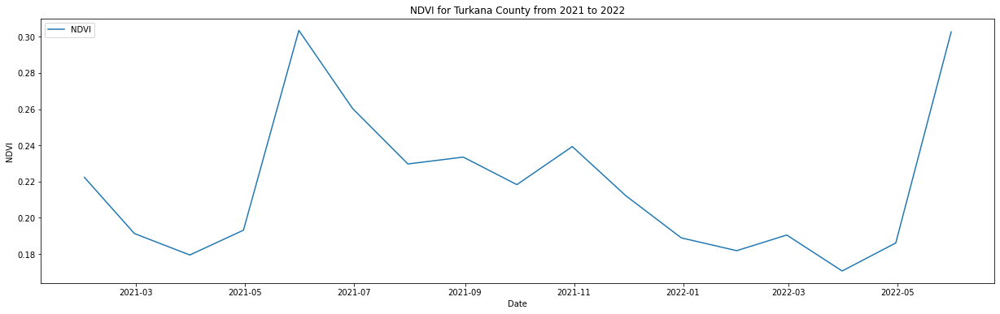

In [33]:
# Plot the NDVI over time for the anomaly time period (x).
fig, ax = plt.subplots(figsize=(21, 6))
ax.plot(
    ndvi_anomalies.index,
    ndvi_anomalies["NDVI"],
    label="NDVI",
)
ax.set_ylabel("NDVI")
ax.set_xlabel("Date")
plt.title(f"NDVI for {county} County from {time_x[0]} to {time_x[1]}")
plt.legend();

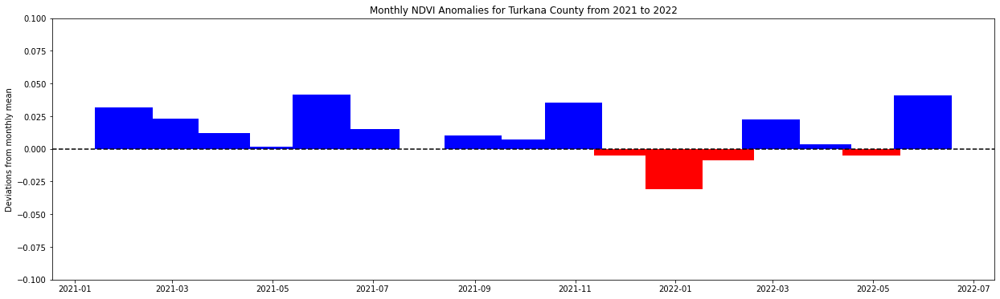

In [34]:
fig, ax = plt.subplots(figsize=(21, 6))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
ax.set_ylim(-0.1, 0.1)
ax.bar(
    ndvi_anomalies.index,
    ndvi_anomalies["NDVI Anomalies"],
    width=35,
    align="center",
    color=(ndvi_anomalies["NDVI Anomalies"] > 0).map({True: "b", False: "r"}),
)
ax.axhline(0, color="black", linestyle="--")
plt.title(f"Monthly NDVI Anomalies for {county} County from {time_x[0]} to {time_x[1]}")
plt.ylabel("Deviations from monthly mean");

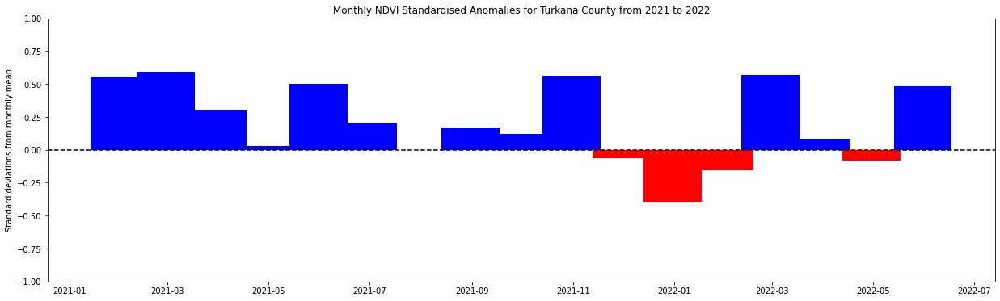

In [35]:
fig, ax = plt.subplots(figsize=(21, 6))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
ax.set_ylim(-1, 1)
ax.bar(
    ndvi_anomalies.index,
    ndvi_anomalies["NDVI Standardised Anomalies"],
    width=35,
    align="center",
    color=(ndvi_anomalies["NDVI Standardised Anomalies"] > 0).map(
        {True: "b", False: "r"}
    ),
)
ax.axhline(0, color="black", linestyle="--")
plt.title(
    f"Monthly NDVI Standardised Anomalies for {county} County from {time_x[0]} to {time_x[1]}"
)
plt.ylabel("Standard deviations from monthly mean");

## Save results as CSV file

In [36]:
ndvi_anomalies.to_csv(f"results/ndvi_anomalies_{county}_{time_x[0]}_{time_x[1]}.csv")

---

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Compatible datacube version:**

In [37]:
print(datacube.__version__)

1.8.6


**Last Tested:**

In [38]:
from datetime import datetime

datetime.today().strftime("%Y-%m-%d")

'2022-05-13'